## Assignment 3 - Dimensionality Reduction

This assignment is based on content discussed in module 6 and will work with the famous MNIST dataset, which is a set of images of handwritten digits https://en.wikipedia.org/wiki/MNIST_database.
The dataset has been provided to you in a .csv file.

## Learning outcomes

- Apply a Random Forest classification algorithm to MNIST dataset
- Perform dimensionality reduction of features using PCA and compare classification on the reduced dataset to that of original one
- Apply dimensionality reduction techniques: t-SNE and LLE

## Questions (15 points total)

__Question 1 (1 point).__ Load the MNIST dataset and split it into a training set and a test set (take the first 60,000 instances for training, and the remaining 10,000 for testing).

In [93]:
# Import libraries.

import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np
import pandas as pd
import plotly.express as px
import random
import seaborn as sns

# Machine Learning libraries

from sklearn.compose import ColumnTransformer
from sklearn.compose import ColumnTransformer
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline
from sklearn.pipeline import Pipeline
from sklearn.manifold import LocallyLinearEmbedding
from sklearn.manifold import MDS
from sklearn.manifold import TSNE
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler

from time import time

In [94]:
# Import the MNIST dataset (CSV format) into a DataFrame.

df = pd.read_csv('./mnist_dataset.csv')

In [95]:
# Take a look at the shape of the data.

df.shape

(70000, 786)

In [96]:
# Verify that it loaded correctly.

df.head()

,Unnamed: 0,label,1x1,1x2,1x3,1x4,1x5,1x6,1x7,1x8,...,28x19,28x20,28x21,28x22,28x23,28x24,28x25,28x26,28x27,28x28
0,0,2,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1,5,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,2,8,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,3,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,4,4,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


Looks good!

In [97]:
# Before we split the data into training and test data, take a look at some of the information
# in the DataFrame.

df.dtypes

Unnamed: 0    int64
label         int64
1x1           int64
1x2           int64
1x3           int64
              ...  
28x24         int64
28x25         int64
28x26         int64
28x27         int64
28x28         int64
Length: 786, dtype: object

Looks like they are all integers.  That is good for machine learning models.

In [98]:
# Get general information about the DataFrame.

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70000 entries, 0 to 69999
Columns: 786 entries, Unnamed: 0 to 28x28
dtypes: int64(786)
memory usage: 419.8 MB


In [99]:
# Determine if any of the fields have null data.

df.isnull().sum()

Unnamed: 0    0
label         0
1x1           0
1x2           0
1x3           0
             ..
28x24         0
28x25         0
28x26         0
28x27         0
28x28         0
Length: 786, dtype: int64

Looks like there is data in all fields.  Therefore, no need to impute or purge fields.

In [100]:
# Create the list of feature columns and remove the target (label).

col_list = df.columns.values.tolist()
col_list.remove('Unnamed: 0')
col_list.remove('label')

# Print the column list.

print (col_list)

['1x1', '1x2', '1x3', '1x4', '1x5', '1x6', '1x7', '1x8', '1x9', '1x10', '1x11', '1x12', '1x13', '1x14', '1x15', '1x16', '1x17', '1x18', '1x19', '1x20', '1x21', '1x22', '1x23', '1x24', '1x25', '1x26', '1x27', '1x28', '2x1', '2x2', '2x3', '2x4', '2x5', '2x6', '2x7', '2x8', '2x9', '2x10', '2x11', '2x12', '2x13', '2x14', '2x15', '2x16', '2x17', '2x18', '2x19', '2x20', '2x21', '2x22', '2x23', '2x24', '2x25', '2x26', '2x27', '2x28', '3x1', '3x2', '3x3', '3x4', '3x5', '3x6', '3x7', '3x8', '3x9', '3x10', '3x11', '3x12', '3x13', '3x14', '3x15', '3x16', '3x17', '3x18', '3x19', '3x20', '3x21', '3x22', '3x23', '3x24', '3x25', '3x26', '3x27', '3x28', '4x1', '4x2', '4x3', '4x4', '4x5', '4x6', '4x7', '4x8', '4x9', '4x10', '4x11', '4x12', '4x13', '4x14', '4x15', '4x16', '4x17', '4x18', '4x19', '4x20', '4x21', '4x22', '4x23', '4x24', '4x25', '4x26', '4x27', '4x28', '5x1', '5x2', '5x3', '5x4', '5x5', '5x6', '5x7', '5x8', '5x9', '5x10', '5x11', '5x12', '5x13', '5x14', '5x15', '5x16', '5x17', '5x18', '5x1

In [101]:
# Set the predictors (features) to be the updated column list and the target to be 
# the 'label' field.

predictors = col_list
target = 'label'

In [102]:
# Split the data into training and test data.

# X are the features (predictors) and y is the target.

X = df[predictors]
y = df[[target]].values

# Split the data into training and test data with a training size of 60,000 records.

X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=60000, random_state=0, stratify=y)

# Print out the shape of the predictors and target training and test data.

print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)


(60000, 784) (10000, 784) (60000, 1) (10000, 1)


In [103]:
# Setup the Machine Learning model Pipeline.

# One Hot Encoding is not required as there are no string classification fields and there 
# are no integer values in the features that would be interpreted as classifications.
# e.g., 1 means "day", 2 means "week" etc.

# However, we always need to apply scaling for our dataset.

# For PCA, scaling helps to constrain the variances so all features are treated equally.
# In other words, it helps to make all numerical columns comparable (e.g., like converting 
# feet to metres).

# Setup the numerical component of the pipeline.

# For this Pipeline, we will only be using the Standard Scaler.

num_scl_step = ('scl', StandardScaler())
num_steps = [num_scl_step]
num_pipe = Pipeline(num_steps)
num_transformers = [('num', num_pipe, predictors)]

# Create the Column Transformer with the categorical and numerical transformers.

ct = ColumnTransformer(transformers=num_transformers)

# Fit the scaling on the X_train data.

ct.fit(X_train)
X_train_scaled = ct.transform(X_train)
X_test_scaled = ct.transform(X_test)

# Display the scaled X_train and X_test shapes and the y_train and y_test shapes
# (should be the same as the originals).

print(X_train_scaled.shape, X_test_scaled.shape, y_train.shape, y_test.shape)


(60000, 784) (10000, 784) (60000, 1) (10000, 1)


__Question 2 (2 points).__ Train a Random Forest classifier on the dataset and time how long it takes, then evaluate the resulting model on the test set.

In [104]:
def display_predictions(y_test, y_pred, model_name, _debug=False):
 
        print ("Model:", model_name)

        # Reshape the data and create the prediction results.

        y_test = np.reshape(y_test, (y_test.size,))
        prediction_results = (y_pred == y_test)

        if _debug: print (y_test)
        if _debug: print (prediction_results)

        # Count the number of correct predictions.

        correct_predictions = np.count_nonzero(prediction_results)

        # Calculate the model accuracy.

        accuracy = round((correct_predictions / training_test_size) * 100, 2)

        # Calculate the TP, FP, FN and TP values.
        
        TN = np.count_nonzero((y_pred == y_test) * (y_pred == 0))
        TP = np.count_nonzero((y_pred == y_test) * (y_pred == 1))
        FN = np.count_nonzero((y_pred != y_test) * (y_pred == 0))
        FP = np.count_nonzero((y_pred != y_test) * (y_pred == 1))

        if _debug: 
            print("TN:" , TN)
            print("TP:" , TP)
            print("FN:" , FN)
            print("FP:" , FP)
        
        # Calculate the accuracy of the model.
        
        acc = (TP + TN) / training_test_size
        print ("Model accuracy: %1.2f" % acc)

        # Calculate the Matthew's correlation.
        
        mcc = (TP * TN - FP * FN)/ np.sqrt((TP + FP)*(TP + FN)*(TN + FP)*(TN + FN))
        print ("Matthews correlation coefficient between the estimates and the true response is: %1.2f" % mcc)

        # Calculate the precision.
        
        if (TP + FP !=0):
            prc = TP / (TP + FP)
        else:
            prc = float('inf')
        if (TP + FN !=0):
            rec = TP / (TP + FN)
        else:
            rec = float('inf')
            
        print ("Model's precision is %1.2f and it's recall is %1.2f" % (prc, rec))
        print("---------------------------------------\n")


In [105]:
# Random Forest Classifier Model

# Invoke the Random Forest Classifier machine learning model.
# Fit the training data and make a set of predictions.

print ("Creating the Random Forest Classifier model...")

rfc = RandomForestClassifier(n_estimators=10)

# Record the start time.

t1 = time()

rfc.fit(X_train_scaled, np.ravel(y_train))

# Record the end time.

t2 = time()

# Make the predictions on the model.

y_pred = rfc.predict(X_test_scaled)

print ("Elapsed time (seconds): %.3f" % (t2-t1))
        
print("Predicted values 1-10:", rfc.predict(X_test_scaled[0:10]))
print("Actual values 1-10:   ", y_test[0:10])
        
# Display the accuracy, correlation, precision and recall of the model results.

display_predictions(y_test, y_pred, "Random Forest Classifier", _debug=False)

Creating the Random Forest Classifier model...
Elapsed time (seconds): 5.041
Predicted values 1-10: [6 2 6 4 0 2 6 7 9 0]
Actual values 1-10:    [[6]
 [2]
 [6]
 [4]
 [0]
 [2]
 [6]
 [7]
 [9]
 [0]]
Model: Random Forest Classifier
Model accuracy: 0.03
Matthews correlation coefficient between the estimates and the true response is: 0.94
Model's precision is 0.98 and it's recall is 0.97
---------------------------------------



The MCC is quite high (.93) as well as the precision (.97) and the recall (.96).  Overall, the performance of this machine learning model is excellent.

Text(0.5, 0, 'Relative Importance')

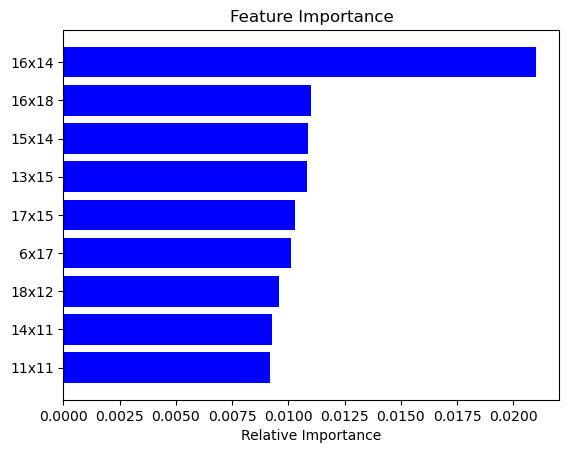

In [106]:
# Print out Feature Importance Chart.

features = df[predictors]
importances = rfc.feature_importances_
indices = np.argsort(importances)[-9:]

plt.title('Feature Importance')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), [predictors[i] for i in indices])
plt.xlabel('Relative Importance')


Interesting.  This gives an indication of the relative importance of each feature.  However, given the actual data set, I'm not sure that this is truly helpful!

__Question 3 (4 points).__ Next, use PCA to reduce the dataset’s dimensionality, with an explained variance ratio of 95%. Train a new Random Forest classifier on the reduced dataset and see how long it takes. Was training much faster? Next evaluate the classifier on the test set: how does it compare to the previous classifier?

In [107]:
# PCA - Random Forest Classifier Model

# Invoke the Principal Component Analysis (PCA) on the Random Forest Classifier 
# machine learning model.
# Fit the training data and make a set of predictions.

# In the future, this can be added to the pipeline.

# Use PCA when you want to make predictions fast but don't really want to explain the
# predictions since we're not sure which features / dimensions contributed to the predictions.
# However, it helps with making final predictions.

print ("Running the PCA...")

# Create the PCA object using the n_components hyperparameter set at 95% to get the top
# 95% features with the highest variance (how many dimensions we want PCA to reduce the dataset to).

pca_result = PCA(n_components=.95)
pca_train = pca_result.fit_transform(X_train_scaled)

print(f'Total number of components used after PCA : {pca_result.n_components_}')
print('Shape: ', pca_train.shape)

pca_test = pca_result.transform(X_test_scaled)

# Invoke the Random Forest Classifier machine learning model.
# Fit the training data and make a set of predictions.

pca_rf = RandomForestClassifier(n_estimators=10, random_state=42)

# Record the start time.

t1 = time()

pca_rf.fit(pca_train, np.ravel(y_train))

# Record the end time.

t2 = time()

y_pred_scaled = pca_rf.predict(pca_test)

print ("Elapsed time (seconds): %.3f" % (t2-t1))
        
print("Predicted values 1-10:", pca_rf.predict(pca_test[0:10]))
print("Actual values 1-10:   ", y_test[0:10])   #, 0])

# Display the accuracy, correlation, precision and recall of the model results.

display_predictions(y_test, y_pred_scaled, "Random Forest Classifier (PCA)", _debug=False)


Running the PCA...
Total number of components used after PCA : 329
Shape:  (60000, 329)
Elapsed time (seconds): 26.655
Predicted values 1-10: [6 2 6 9 0 2 6 7 9 0]
Actual values 1-10:    [[6]
 [2]
 [6]
 [4]
 [0]
 [2]
 [6]
 [7]
 [9]
 [0]]
Model: Random Forest Classifier (PCA)
Model accuracy: 0.03
Matthews correlation coefficient between the estimates and the true response is: 0.86
Model's precision is 0.97 and it's recall is 0.90
---------------------------------------



In [109]:
pca_result.explained_variance_ratio_

array([0.05676934, 0.04063432, 0.03759347, 0.02917911, 0.02548559,
       0.02218505, 0.01921271, 0.01756849, 0.0154721 , 0.01405074,
       0.01353463, 0.01214456, 0.01123016, 0.01097202, 0.01035127,
       0.01002038, 0.00942277, 0.00927791, 0.00898447, 0.00867792,
       0.00830251, 0.00807819, 0.00767664, 0.00751036, 0.00722762,
       0.00694208, 0.00690377, 0.00658567, 0.00635021, 0.00621344,
       0.00602   , 0.00594314, 0.00571612, 0.00565072, 0.0055809 ,
       0.00539049, 0.00532355, 0.00520182, 0.00509315, 0.00485462,
       0.00481066, 0.00465845, 0.00455902, 0.00455135, 0.00446609,
       0.00442433, 0.00440534, 0.00435736, 0.00429016, 0.00423381,
       0.00409466, 0.00407139, 0.00398008, 0.00394291, 0.00390966,
       0.00382369, 0.00378947, 0.00373437, 0.00365531, 0.00358004,
       0.00354014, 0.0035028 , 0.00347322, 0.00343805, 0.00339229,
       0.00331792, 0.0032854 , 0.00322641, 0.0031665 , 0.00316069,
       0.00312743, 0.0030961 , 0.00308501, 0.0030195 , 0.00300

In [110]:
pca_result.explained_variance_ratio_.sum()

0.950182094990519

PCA has reduced the dimensionality from 784 to 329.  329 is a good amount of dimensions to be retained after PCA.   It has kept 95% of the original data set which makes sense as we asked the PCA to hold 95%!

The time took longer for training the model (~23 seconds vs ~4 seconds).  However, we are asking for 95% of the original and the dimensions could be quite dense.

The MCC is quite high (.86) as well as the precision (.97) and the recall (.90).  Overall, the performance of this machine learning model is excellent but maybe not as great as when using the entire dimensions.  However, this is to be expected when you reduce the dimensions - you will lose some data.

Text(0.5, 0, 'Relative Importance')

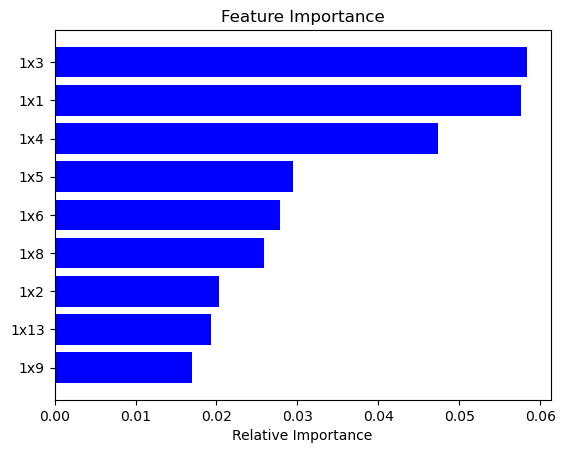

In [111]:
# This doesn't really work after PCA.  This should be done on the original set.

features = df[predictors]
importances = pca_rf.feature_importances_
indices = np.argsort(importances)[-9:]

plt.title('Feature Importance')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), [predictors[i] for i in indices])
plt.xlabel('Relative Importance')


Yeah, it doesn't really work after PCA has been applied as it just seems to be the first set of features.

__Question 4 (4 points).__ Use t-SNE to reduce the MNIST dataset, show result graphically.

In [80]:
# t-SNE is mostly used for visualization and not to transfer the data set for machine learning.

# Apply to entire mnist dataset.

mnist_df_subset = df.loc[:, :].copy()

time_start = time()

# Reduce dimensions down to the typical 2.

tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_result = tsne.fit_transform(mnist_df_subset[predictors].values)

print('t-SNE done! Time elapsed: {} seconds'.format(time()-time_start))

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 70000 samples in 0.127s...
[t-SNE] Computed neighbors for 70000 samples in 206.501s...
[t-SNE] Computed conditional probabilities for sample 1000 / 70000
[t-SNE] Computed conditional probabilities for sample 2000 / 70000
[t-SNE] Computed conditional probabilities for sample 3000 / 70000
[t-SNE] Computed conditional probabilities for sample 4000 / 70000
[t-SNE] Computed conditional probabilities for sample 5000 / 70000
[t-SNE] Computed conditional probabilities for sample 6000 / 70000
[t-SNE] Computed conditional probabilities for sample 7000 / 70000
[t-SNE] Computed conditional probabilities for sample 8000 / 70000
[t-SNE] Computed conditional probabilities for sample 9000 / 70000
[t-SNE] Computed conditional probabilities for sample 10000 / 70000
[t-SNE] Computed conditional probabilities for sample 11000 / 70000
[t-SNE] Computed conditional probabilities for sample 12000 / 70000
[t-SNE] Computed conditional probabilities for 

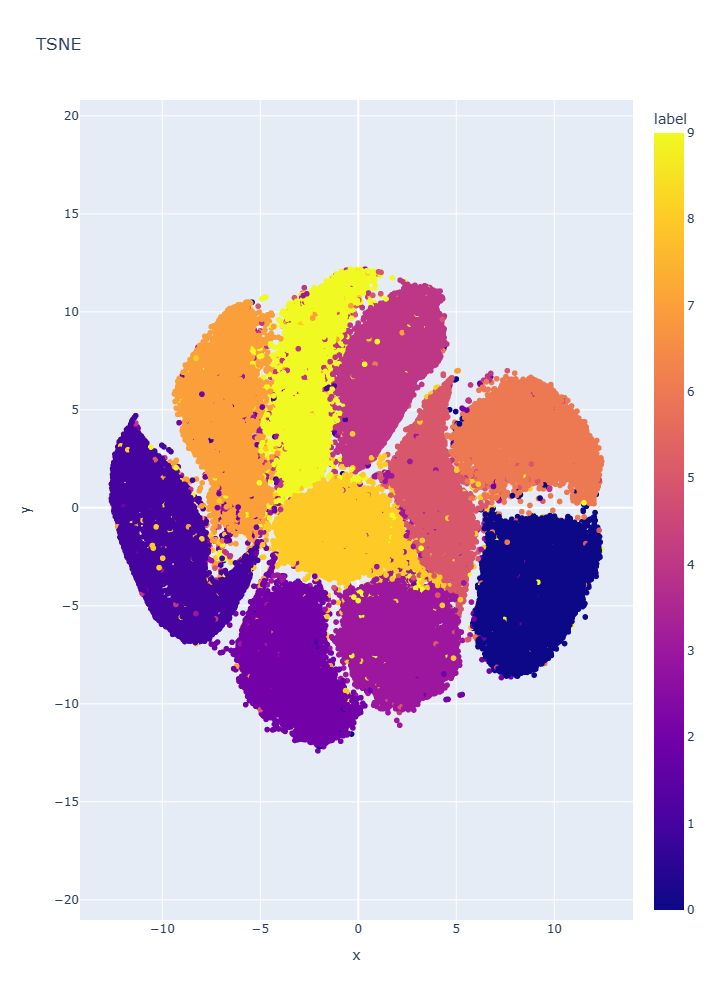

In [81]:
# Create the scatter plot of the t-SNE.

TARGET = 'label'

mnist_df_subset = df.loc[:, :].copy()

fig = px.scatter(x=tsne_result[:,0], y=tsne_result[:,1], color=mnist_df_subset[TARGET], title='TSNE')
fig.update_layout(coloraxis_colorbar=dict(title=TARGET), height=1000)
fig.update_yaxes(scaleanchor = 'x', scaleratio=1)
fig.show()

<Axes: xlabel='tsne-2d-one', ylabel='tsne-2d-two'>

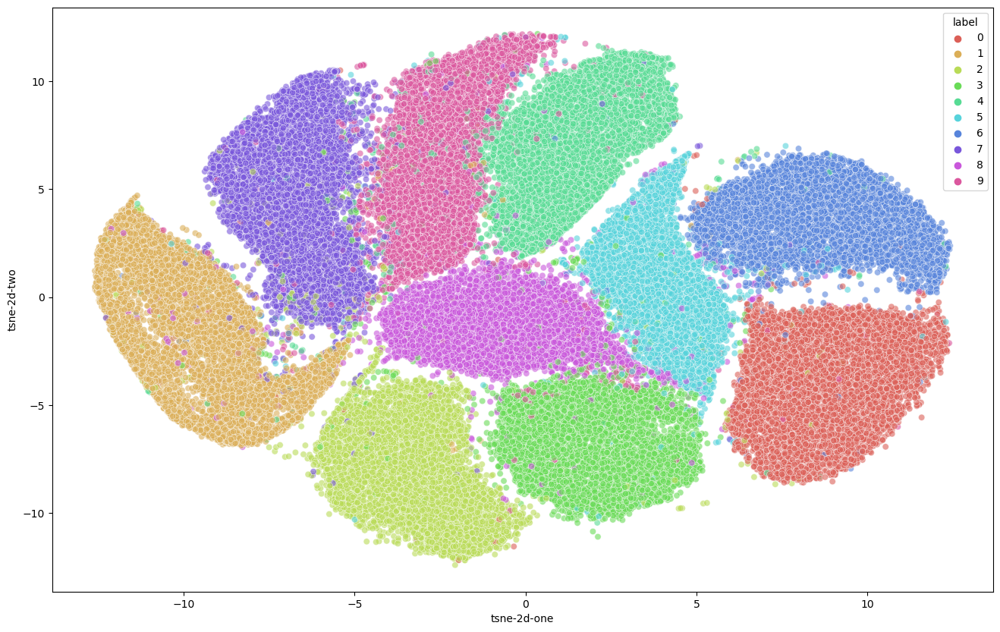

In [82]:
# Another way of showing pretty much the same thing as above.

mnist_df_subset['tsne-2d-one'] = tsne_result[:, 0]
mnist_df_subset['tsne-2d-two'] = tsne_result[:, 1]

plt.figure(figsize=(16,10))
sns.scatterplot(x='tsne-2d-one', y='tsne-2d-two', hue='label',
               palette=sns.color_palette('hls', 10),
               data=mnist_df_subset,
               alpha=0.6)

This scatter plot shows that there are clear classifications of data.  That is what t-SNE does, it helps during Exploratory Data Analysis to see if the data is messy or if it is organized (typically the best visualization technique).  That there are clear patterns to the data so regression should work well on the data.

__Question 5 (4 points).__ Compare with other dimensionality methods: _Locally Linear Embedding_ (LLE) or _Multidimensional scaling_ (MDS).

In [112]:
# LLE 

# Any more than 5000 or so causes me to run out of memory.  Therefore, just invoking the
# model on 1000 records.

N = 1000

lle_df_subset = df.loc[:N, :].copy()

lle = LocallyLinearEmbedding(n_components=2, n_neighbors=10, random_state=41)
X_reduced_sr = lle.fit_transform(lle_df_subset[predictors].values)

In [113]:
X_reduced_sr.shape

(1001, 2)

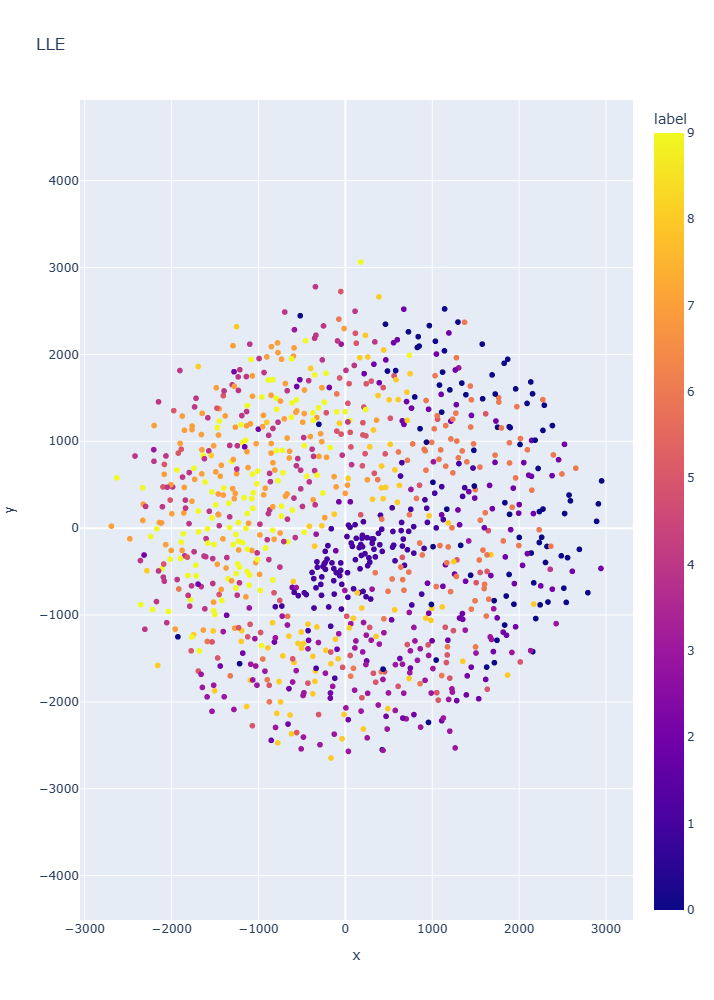

In [114]:
TARGET = 'label'

fig = px.scatter(x=X_reduced[:,0], y=X_reduced[:,1], color=lle_df_subset[TARGET], title='LLE')
fig.update_layout(coloraxis_colorbar=dict(title=TARGET), height=1000)
fig.update_yaxes(scaleanchor = 'x', scaleratio=1)
fig.show()

In [115]:
# MDS Data Model

# Any more than 5000 or so causes me to run out of memory.  Therefore, just invoking the
# model on 1000 records.

N=1000
mds_df_subset = df.loc[:N, :].copy()

reducer = MDS(n_components=2, n_jobs=-1)
X_reduced = reducer.fit_transform(mds_df_subset)

print(X_reduced.shape)

C:\Users\camer\anaconda3\lib\site-packages\sklearn\manifold\_mds.py:299: FutureWarning:

The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.



(1001, 2)


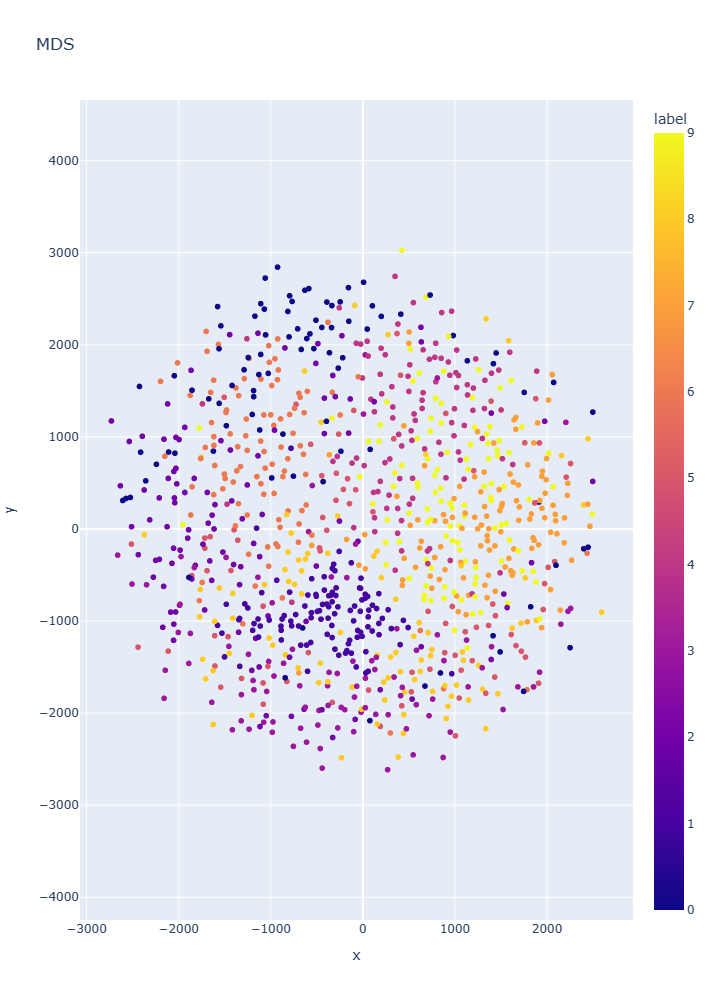

In [116]:
TARGET = 'label'

#mnist_df_subset = df.loc[:, :].copy()
#y_train

fig = px.scatter(x=X_reduced[:,0], y=X_reduced[:,1], color=mds_df_subset[TARGET], title='MDS')
fig.update_layout(coloraxis_colorbar=dict(title=TARGET), height=1000)
fig.update_yaxes(scaleanchor = 'x', scaleratio=1)
fig.show()

The LLE and MDS dimensionality reduction models look very similar but the data clusters are a bit different - of course, I could only do it on 1000 records.